# Workshop 4 — Automating explanation analysis with SpRAy

**Goal:** discover recurring model strategies across many local explanations.

$$\text{images}\rightarrow\text{carton LRP maps}\rightarrow
\text{spectral or direct clustering}\rightarrow\text{interactive inspection}$$

We apply ImageNet-W to a seeded subset of one Imagenette class. The watermark
labels are hidden during clustering and revealed afterward only for evaluation.

**RTG 2767 version:** complete solution.


## Presenter path — about 25 minutes

1. **Say:** SpRAy clusters explanations, not images.
2. **Run:** load cached heatmaps and compare spectral clustering with k-means.
3. **Show:** the eigengap suggests a broad split, then inspect $K=6$ for finer structure.
4. **Reveal labels:** measure whether one cluster is enriched for watermarks.
5. **Investigate:** click points and inspect image, heatmap, and both labels.

The central claim is modest: clustering can prioritize recurring explanation
patterns for human inspection. It does not name or validate a strategy by itself.


## Run once — environment setup

Run the next cell; **do not present it**. In Google Colab it clones the small
public workshop repository and installs the additional dependencies. The first
run also downloads pretrained model weights and Imagenette.


In [1]:
import subprocess
import sys
from pathlib import Path

PUBLIC_REPOSITORY_URL = "https://github.com/erfanhatefi/rtg2767-xai-workshop.git"
PUBLIC_REPOSITORY_REF = "main"

IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    REPOSITORY_ROOT = Path("/content/rtg2767-xai-workshop")
    if not (REPOSITORY_ROOT / "utils").is_dir():
        subprocess.run(
            [
                "git",
                "clone",
                "--depth",
                "1",
                "--branch",
                PUBLIC_REPOSITORY_REF,
                PUBLIC_REPOSITORY_URL,
                str(REPOSITORY_ROOT),
            ],
            check=True,
        )
    subprocess.run(
        [
            sys.executable,
            "-m",
            "pip",
            "install",
            "-q",
            "-r",
            str(REPOSITORY_ROOT / "requirements.txt"),
        ],
        check=True,
    )
else:
    candidates = (Path.cwd(), *Path.cwd().parents)
    REPOSITORY_ROOT = next(
        path for path in candidates if (path / "utils").is_dir()
    )

sys.path.insert(0, str(REPOSITORY_ROOT))
WORKSHOP_DATA_ROOT = REPOSITORY_ROOT / "workshop_data"
print("Setup complete.")

Setup complete.


## Before attributing: three labels that are easy to confuse

- **Dataset label:** what the dataset says is present in the image.
- **Top-1 prediction:** the output with the largest score for this input.
- **Explanation target:** the particular output score whose heatmap we request.

An ImageNet model has 1,000 output scores, indexed from 0 to 999. A heatmap is
always conditional on one selected output; it need not be the top-1 prediction.
In these notebooks we resolve targets by readable names and print the resulting
index: `carton` is index **478**, `French horn` is index **566**, and index **0**
is `tench`. The `carton` class means a cardboard carton/box. ImageNet-W adds a
watermark intended to raise that output—it does not claim that a carton is
actually visible in the photograph.


## Controlled case study: French horn + ImageNet-W

[Imagenette](https://github.com/fastai/imagenette) provides real ImageNet-quality
photographs in a manageable download. We use only its `French horn` class so
object class does not trivially determine the clusters.

[ImageNet-W](https://github.com/facebookresearch/Whac-A-Mole) overlays a
published watermark associated with the ImageNet `carton` output. Here,
`carton` means a cardboard carton/box (ImageNet index 478). A fixed 25% of
images receive the watermark. We then ask whether heatmap clustering recovers
this known intervention.

This controlled task evaluates discovery machinery; it is not evidence that an
unknown real-world Clever Hans strategy has been found.


In [2]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import torch
from IPython.display import HTML, FileLink, display

from utils import (
    build_clickable_spray_explorer,
    build_cluster_comparison_figure,
    build_spectral_diagnostics_figure,
    cluster_heatmaps,
    get_spray_heatmaps,
    load_watermarked_images,
    make_spray_cohort,
    plot_bwr_attributions,
    summarize_watermark_clusters,
)

SEED = 7
np.random.seed(SEED)
torch.manual_seed(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"PyTorch {torch.__version__} | {device}")

PyTorch 2.7.1+cu128 | cuda


---
## 1. Declare the scientific choices

Separate choices that change the scientific question from choices that only
change runtime:

- **cohort:** 120 `French horn` images, with a seeded 25% watermarked subset;
- **explanation:** one signed LRP map for the `carton` logit per image;
- **representation:** average-pool each map to 20×20, flatten it, then normalize
  its L2 length so spatial pattern dominates total magnitude;
- **graph:** connect each heatmap to its 10 nearest neighbors;
- **cluster count:** inspect eigengaps for 2–8 clusters and deliberately plot six;
- **runtime only:** extraction batch size and cache reuse;
- **visualization only:** seeded t-SNE of the same heatmap vectors.

Changing pooling, normalization, neighbors, or cluster count can change the
result and must be reported. Full-resolution LRP maps are cached so these
clustering choices can be revisited without recomputing explanations.


In [3]:
# Storage choices: these do not change the scientific question.
DATA_ROOT = WORKSHOP_DATA_ROOT
CACHE_ROOT = REPOSITORY_ROOT / "workshop_cache"
OUTPUT_ROOT = REPOSITORY_ROOT / "workshop_outputs"
DOWNLOAD_IMAGENETTE = True
REUSE_HEATMAP_CACHE = True

# Cohort and intervention choices.
DATASET_CLASS_WNID = "n03394916"  # French horn
EXPLANATION_TARGET_NAME = "carton"
WATERMARK_FRACTION = 0.25
MAX_SAMPLES = 120

# Runtime choice: images processed per model pass; affects memory and speed.
BATCH_SIZE = 16

# Heatmap representation: 224×224 → 20×20 → 400-dimensional vector.
POOLED_HEATMAP_SIZE = 20
NORMALIZE_EACH_HEATMAP = True

# Spectral graph: each heatmap is connected to its nearest neighbors.
NUM_NEIGHBORS = 10

# Inspect candidate cluster counts from 2 through this upper limit.
MAX_CLUSTERS_TO_INSPECT = 8

# This is the main variable to change when exploring cluster resolution.
# Try an integer from 2 to 8, or use None to select the largest eigengap.
NUMBER_OF_CLUSTERS = 6

In [4]:
# Select one ImageNet class and watermark a seeded subset.
sample_records, dataset_metadata = make_spray_cohort(
    root=DATA_ROOT,
    class_wnid=DATASET_CLASS_WNID,
    max_samples=MAX_SAMPLES,
    watermark_fraction=WATERMARK_FRACTION,
    download=DOWNLOAD_IMAGENETTE,
    seed=SEED,
)

# Each record stores its path and intervention label; metadata summarizes cohort.
dataset_class_name = dataset_metadata["target_name"]
num_watermarked = dataset_metadata["watermarked_samples"]

print(f"Dataset label      : {dataset_class_name!r}")
print(f"Explanation target : {EXPLANATION_TARGET_NAME!r}")
print(f"Watermarked inputs : {num_watermarked}/{len(sample_records)}")

Dataset label      : 'French horn'
Explanation target : 'carton'
Watermarked inputs : 30/120


---
## 2. Extract and cache one ordinary LRP heatmap per image

We use the same explicit teaching composite as the LRP notebook:

- $z^+$ for convolutions, excluding bias from redistribution;
- stabilized $\epsilon$ rule for linear layers with $\epsilon=10^{-6}$, excluding bias;
- identity redistribution through ReLU;
- BatchNorm folded into the preceding ResNet convolutions.

For a batch $X$, one backward pass explains the same target logit independently for every sample:

$$R(X)=X\odot\widetilde{\nabla}_X\sum_b s_c(X_b).$$

This batching is valid here because evaluation-mode ResNet-18 has no operation coupling different samples. RGB relevance is summed to a signed 224×224 map.

In [5]:
# Compute or reload one signed [224, 224] carton-LRP map per image.
heatmaps, sample_records, heatmap_info = get_spray_heatmaps(
    sample_records=sample_records,
    dataset_class_wnid=DATASET_CLASS_WNID,
    target_name=EXPLANATION_TARGET_NAME,
    cache_root=CACHE_ROOT,
    device=device,
    batch_size=BATCH_SIZE,
    reuse_cache=REUSE_HEATMAP_CACHE,
    seed=SEED,
)

# Resolve returned metadata once; later cells use these readable names.
target_name = EXPLANATION_TARGET_NAME
target_index = heatmap_info["target_index"]
target_slug = target_name.replace(" ", "_")
cache_status = "loaded" if heatmap_info["loaded_from_cache"] else "computed"

print(f"Heatmaps [samples, height, width]: {tuple(heatmaps.shape)}")
print(f"Cache: {cache_status} | {heatmap_info['cache_path']}")

Heatmaps [samples, height, width]: (120, 224, 224)
Cache: loaded | /home/erfan/Projects/LRP-Implementations/LeXplaiNet/rtg2767-xai-workshop/workshop_cache/spray_resnet18_n03394916_carton_wm30_120_seed7.npz


Top-1 'carton' predictions: 1/120
Mean clean 'carton' logit      : -0.34
Mean watermarked 'carton' logit: +7.52


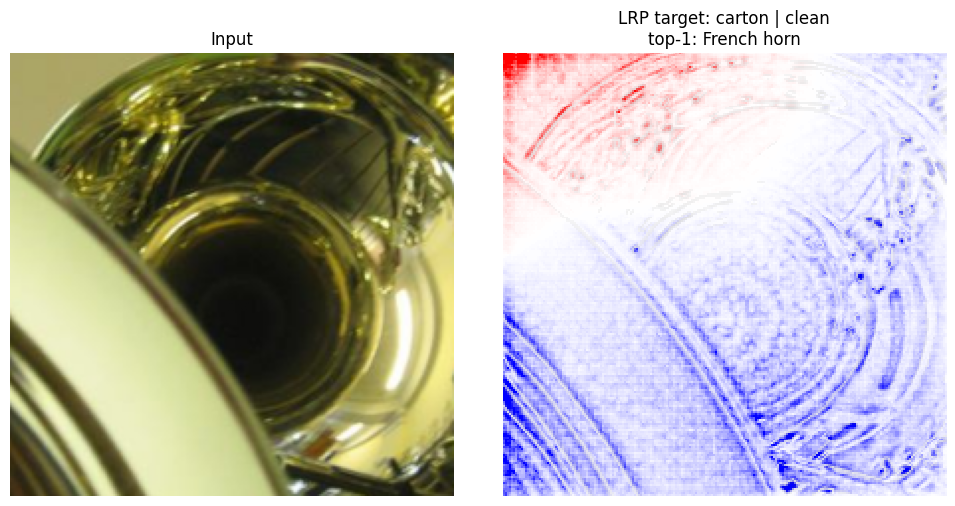

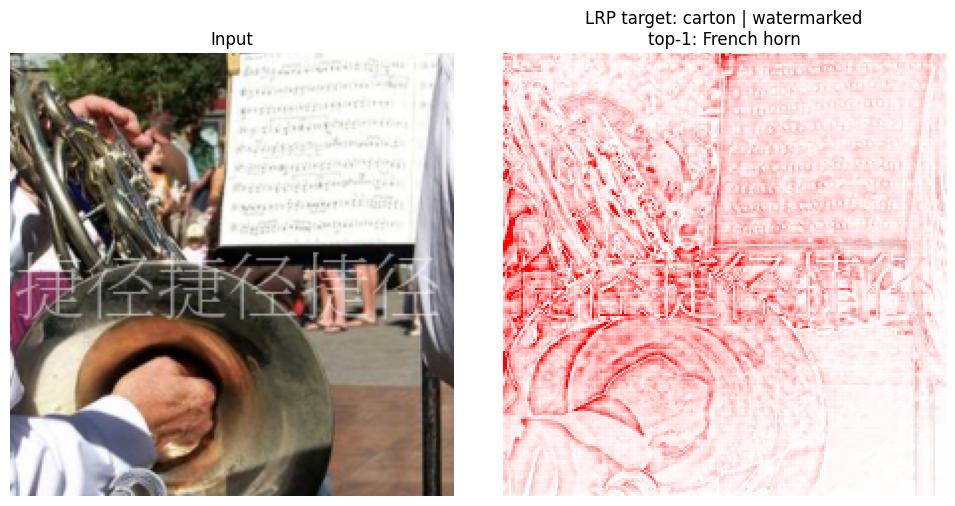

In [6]:
# Top-1 prediction and explanation target are intentionally kept separate.
num_target_predictions = sum(
    record["predicted_index"] == target_index for record in sample_records
)

# These values test whether the intervention changes the selected carton logit.
target_logits = np.asarray([record["target_logit"] for record in sample_records])
watermark_labels = np.asarray(
    [record["imagenet_w_watermark"] for record in sample_records],
    dtype=bool,
)

print(
    f"Top-1 {target_name!r} predictions: "
    f"{num_target_predictions}/{len(sample_records)}"
)
clean_mean_logit = target_logits[~watermark_labels].mean()
watermarked_mean_logit = target_logits[watermark_labels].mean()
print(f"Mean clean {target_name!r} logit      : {clean_mean_logit:+.2f}")
print(f"Mean watermarked {target_name!r} logit: {watermarked_mean_logit:+.2f}")

# Inspect one control and one intervened example before trusting a batch analysis.
example_indices = [
    int(np.flatnonzero(~watermark_labels)[0]),
    int(np.flatnonzero(watermark_labels)[0]),
]
for example_index in example_indices:
    record = sample_records[example_index]
    example_image = load_watermarked_images(
        [record],
        torch.device("cpu"),
    )
    status = "watermarked" if record["imagenet_w_watermark"] else "clean"
    plot_bwr_attributions(
        example_image,
        [heatmaps[example_index]],
        [
            f"LRP target: {target_name} | {status}\n"
            f"top-1: {record['predicted_name']}"
        ],
        # Use one robust signed color scale per displayed map.
        q=99.5,
    )

**Sanity check before clustering:** confirm that the maps are finite, spatially structured, and genuinely target-specific. SpRAy cannot repair an incorrect attribution implementation. Incorrectly classified samples are intentionally retained: removing them would condition the analysis on model success and can hide distinct failure strategies.

---
## 3. Cluster the explanations

### Spectral clustering: the mental model

**Input:** one signed LRP heatmap per image. **Output:** one cluster label per
heatmap, plus eigenvalue diagnostics and a separate t-SNE display.

SpRAy clusters **explanations**, not the original images. Each pooled heatmap
$r_i\in\mathbb{R}^{400}$ becomes one node in a graph:

$$\text{LRP maps} \rightarrow \text{similarity graph} \rightarrow
\text{graph Laplacian} \rightarrow \text{eigenvectors} \rightarrow
\text{clusters}.$$

#### 1. Build a similarity graph

For every heatmap, this notebook finds its 10 nearest heatmap neighbors. The
symmetric adjacency matrix $A$ records which explanations are connected. This
changes the question from *which maps share one Euclidean centroid?* to *which
maps belong to the same well-connected graph region?* That is useful when a
recurring relevance pattern is not a compact, spherical group.

#### 2. Describe graph connectivity with the Laplacian

The degree matrix contains each node's total edge weight,
$D_{ii}=\sum_j A_{ij}$. We use the normalized graph Laplacian

$$L_{\mathrm{sym}}=I-D^{-1/2}AD^{-1/2}.$$

Its smallest-eigenvalue directions change slowly across strongly connected
nodes and mainly change across weak connections. In the ideal case, the number
of exactly zero eigenvalues equals the number of disconnected graph components.
Real heatmap groups are rarely completely disconnected, so we usually see small
rather than exactly zero eigenvalues.

#### 3. Use eigenvalues to propose $K$ and eigenvectors to separate samples

After sorting $0\leq\lambda_1\leq\lambda_2\leq\cdots$, a relatively
large eigengap $\lambda_{K+1}-\lambda_K$ suggests inspecting $K$ graph
communities. This is a heuristic, not proof of $K$ semantic model strategies.
The first $K$ eigenvectors then give every heatmap new graph-based coordinates;
k-means assigns clusters in that **spectral embedding**.

#### 4. Keep clustering separate from visualization

Direct k-means on the 400 heatmap values is shown as a baseline. t-SNE is used
only afterward to draw both labelings in two dimensions; neither method clusters
the t-SNE points. Therefore, apparent t-SNE distances are not clustering evidence.

In short: **eigenvalues suggest plausible resolutions; eigenvectors describe how
to separate the graph.** The hidden watermark labels are revealed only after
clustering to evaluate whether a discovered group aligns with the intervention.


In [7]:
# Run clustering and visualization coordinates from the same heatmap vectors.
analysis = cluster_heatmaps(
    heatmaps,
    sample_records,
    output_size=POOLED_HEATMAP_SIZE,
    normalize_each=NORMALIZE_EACH_HEATMAP,
    num_neighbors=NUM_NEIGHBORS,
    max_clusters=MAX_CLUSTERS_TO_INSPECT,
    num_clusters=NUMBER_OF_CLUSTERS,
    seed=SEED,
)

# Unpack named outputs so the following plotting cells remain easy to read.
spectral_result = analysis["spectral"]
spectral_labels = analysis["spectral_labels"]
kmeans_labels = analysis["kmeans_labels"]
tsne_embedding = analysis["embedding"]
sample_records = analysis["sample_records"]
num_clusters = spectral_result["num_clusters"]

# ARI=1 means identical partitions; about 0 is chance-level agreement.
print(f"Heatmap feature matrix [samples, features]: {analysis['features'].shape}")
print(f"Largest eigengap suggests K: {spectral_result['suggested_clusters']}")
print(f"Clustering shown below uses K: {num_clusters}")
print(f"Spectral ARI vs watermark: {analysis['metrics']['spectral_vs_watermark']:+.3f}")
print(f"k-means ARI vs watermark : {analysis['metrics']['kmeans_vs_watermark']:+.3f}")
print(f"Method agreement         : {analysis['metrics']['method_agreement']:+.3f}")

Heatmap feature matrix [samples, features]: (120, 400)
Largest eigengap suggests K: 2
Clustering shown below uses K: 6
Spectral ARI vs watermark: +0.073
k-means ARI vs watermark : +0.074
Method agreement         : +0.700


In [8]:
# First inspect eigenvalues/eigengaps, then compare labels on one t-SNE view.
build_spectral_diagnostics_figure(spectral_result).show()
build_cluster_comparison_figure(
    tsne_embedding,
    {
        "SpRAy spectral clustering": spectral_labels,
        "Direct k-means": kmeans_labels,
    },
).show()

Read these plots conservatively:

- Small Laplacian eigenvalues indicate graph regions that are disconnected or
  only weakly connected.
- A large gap after the first $K$ eigenvalues motivates inspecting $K$ groups;
  it does not prove that exactly $K$ semantic concepts exist.
- Different colors across the two t-SNE panels show where graph connectivity
  changes the grouping relative to direct centroid-based k-means.
- Apparent t-SNE distances and orientation are not clustering evidence.

### Where to try another number of clusters

Change `NUMBER_OF_CLUSTERS` in **Section 1**, then rerun Sections 3–6. Use an
integer from 2 to `MAX_CLUSTERS_TO_INSPECT`, or set it to `None` to use the
largest inspected eigengap automatically. Cached heatmaps are reused, so this
does **not** repeat the expensive LRP extraction.

For the supplied cache, the largest eigengap suggests $K=2$, while the gap at
$K=6$ is also notable. We deliberately plot $K=6$ to inspect finer subgroups.
This does not make six the uniquely correct answer: increasing $K$ trades a
broad, high-recall group for smaller and potentially purer candidate groups.

The **adjusted Rand index (ARI)** compares two partitions without assuming that
their numeric cluster IDs match. `1` means identical partitions, values near
`0` indicate agreement expected by chance, and negative values indicate less
agreement than expected by chance. ARI measures agreement—not causality or
semantic quality.


---
## 4. Did the heatmaps reveal the hidden artifact?

Now—and only now—we reveal the watermark labels. A convincing controlled
demonstration requires three separate observations:

1. adding the watermark raises the selected `carton` score;
2. its LRP maps repeatedly emphasize watermark-like regions;
3. an unsupervised cluster is enriched for those watermarked samples.

This is recovery of a **known injected artifact**, not discovery of an unknown
natural shortcut. Cluster IDs alone have no meaning, so we select the candidate
artifact cluster after label reveal only for evaluation.


In [9]:
watermark_summary = summarize_watermark_clusters(
    spectral_labels,
    sample_records,
)

print("cluster | samples | watermarked | watermark rate")
for row in watermark_summary["clusters"]:
    print(
        f"{row['cluster']:7d} | {row['samples']:7d} | "
        f"{row['watermarked']:11d} | {row['watermark_rate']:13.1%}"
    )

print()
print(f"Overall watermark rate : {watermark_summary['base_rate']:.1%}")
print(f"Candidate cluster       : {watermark_summary['candidate_cluster']}")
print(f"Candidate precision     : {watermark_summary['candidate_precision']:.1%}")
print(f"Watermark recall        : {watermark_summary['candidate_recall']:.1%}")
print(f"Enrichment over baseline: {watermark_summary['candidate_enrichment']:.2f}×")

cluster | samples | watermarked | watermark rate
      0 |      21 |           1 |          4.8%
      1 |      25 |          12 |         48.0%
      2 |      16 |           0 |          0.0%
      3 |      18 |           0 |          0.0%
      4 |      18 |          14 |         77.8%
      5 |      22 |           3 |         13.6%

Overall watermark rate : 25.0%
Candidate cluster       : 4
Candidate precision     : 77.8%
Watermark recall        : 46.7%
Enrichment over baseline: 3.11×


### What the tested result supports

At $K=2$, all 30 watermarked images enter one broad 62-image cluster: recall is
100%, but precision is only about 48%. At $K=6$, that broad pattern splits into
finer groups. With the supplied cache and seed, the most enriched group contains
14 watermarked images among 18 samples (about 78% precision), while other
watermarked images appear in additional groups. Its single-cluster recall is
therefore about 47%.

The useful conclusion is not that two or six is universally correct. The
artifact is **discoverable for inspection**, and $K$ controls whether we inspect
one broad family or several sub-patterns. Cluster IDs themselves are arbitrary.

## 5. What strategy does each cluster show?

Cluster means provide a quick overview using one shared color scale. A mean can
hide cancellation and minority patterns, so use it only to decide which
individual samples to open next.


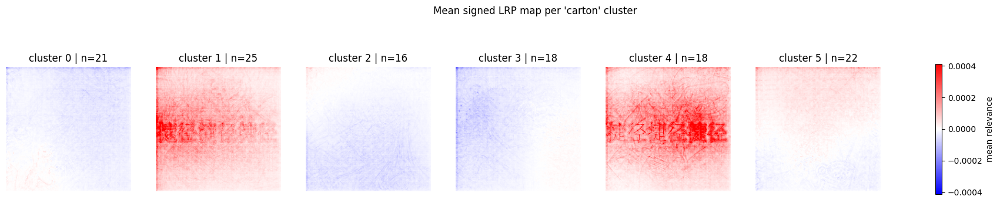

In [10]:
# Average full-resolution maps within each spectral cluster.
cluster_mean_heatmaps = torch.stack(
    [
        heatmaps[spectral_labels == cluster_index].mean(dim=0)
        for cluster_index in range(num_clusters)
    ]
)

# One shared signed scale makes magnitude comparable across cluster panels.
shared_scale = float(
    np.percentile(np.abs(cluster_mean_heatmaps.numpy()), 99.5)
)
shared_scale = max(shared_scale, 1e-12)

figure, axes = plt.subplots(
    1,
    num_clusters,
    figsize=(4 * num_clusters, 4),
    squeeze=False,
)
for cluster_index, axis in enumerate(axes[0]):
    image_artist = axis.imshow(
        cluster_mean_heatmaps[cluster_index],
        cmap="bwr",
        vmin=-shared_scale,
        vmax=shared_scale,
    )
    cluster_size = int((spectral_labels == cluster_index).sum())
    axis.set_title(f"cluster {cluster_index} | n={cluster_size}")
    axis.axis("off")

figure.colorbar(
    image_artist,
    ax=axes.ravel().tolist(),
    shrink=0.72,
    label="mean relevance",
)
figure.suptitle(f"Mean signed LRP map per {target_name!r} cluster", y=1.02)
plt.show()

---
## 6. Click to inspect every point

Clicking a point reveals the original input, signed `bwr` LRP map, overlay,
top-1 prediction, explained output, spectral cluster, and direct k-means
cluster. The standalone HTML works without a live Python callback.

The t-SNE seed and PCA initialization are fixed, so reruns with the same data
and library versions are normally reproducible. Changing the seed or data can
change the arrangement because t-SNE optimizes a non-convex objective.



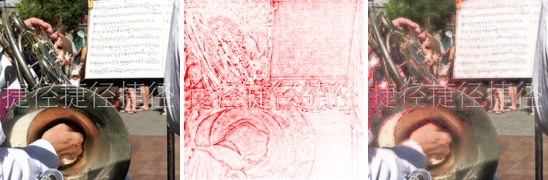
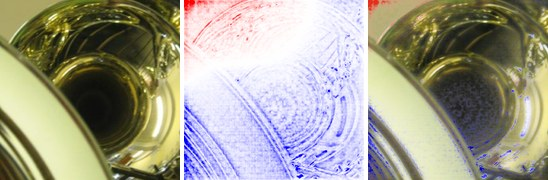
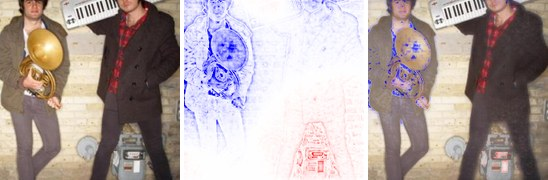
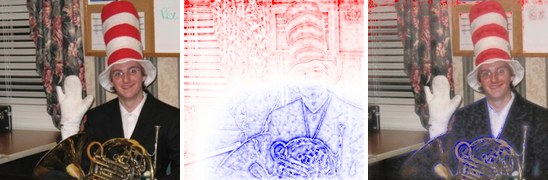
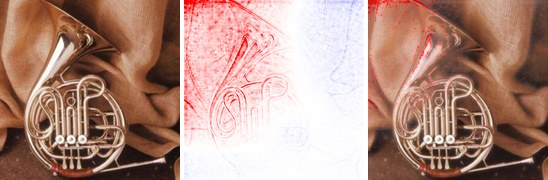
...
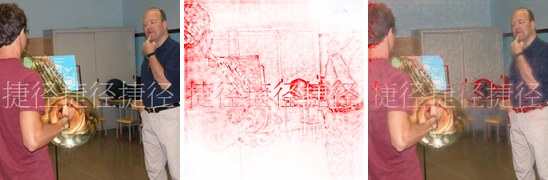
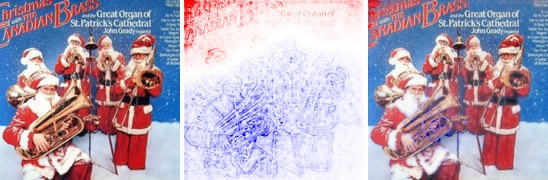
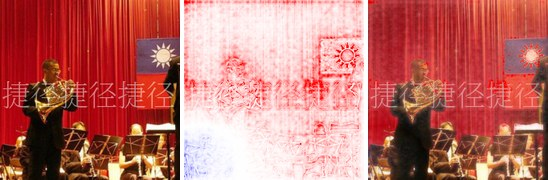
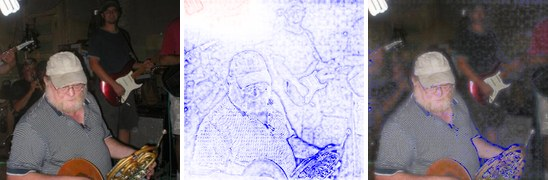
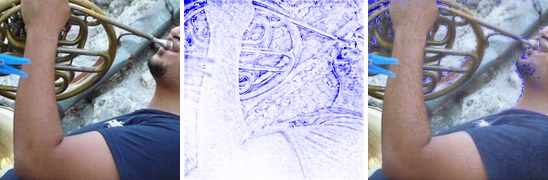

Standalone explorer: /home/erfan/Projects/LRP-Implementations/LeXplaiNet/rtg2767-xai-workshop/workshop_outputs/spray_n03394916_carton_wm30_120_k6_interactive.html


/home/erfan/Projects/LRP-Implementations/LeXplaiNet/rtg2767-xai-workshop/workshop_outputs/spray_n03394916_carton_wm30_120_k6_interactive.html

In [11]:
# Save a self-contained HTML file for inspection outside Jupyter.
interactive_output_path = OUTPUT_ROOT / (
    f"spray_{DATASET_CLASS_WNID}_{target_slug}_wm{num_watermarked}_"
    f"{len(sample_records)}_k{num_clusters}_interactive.html"
)
interactive_html = build_clickable_spray_explorer(
    embedding=tsne_embedding,
    cluster_labels=spectral_labels,
    sample_records=sample_records,
    heatmaps=heatmaps,
    output_path=interactive_output_path,
    include_plotlyjs=True,  # Embed Plotly so the file also works offline.
)
display(HTML(interactive_html))
print(f"Standalone explorer: {interactive_output_path.resolve()}")
display(FileLink(interactive_output_path))

### Investigation prompts

Before revealing the watermark field, ask:

- Which clusters show text-like horizontal relevance?
- Do spectral clustering and direct k-means disagree on interpretable cases?
- Which clean inputs join artifact-heavy clusters, and what do their maps share?
- Do conclusions persist after changing neighbors, pooling, or the random seed?

The adjusted Rand index evaluates agreement with the known intervention. It
does not turn a heatmap cluster into a causal explanation. The causal check here
is the paired intervention: add or remove the watermark and measure the selected
`carton` score.


---
## 7. Extensions

### Natural, uncontrolled case

Try `DATASET_CLASS_WNID = "n01440764"`,
`EXPLANATION_TARGET_NAME = "tench"`, and `WATERMARK_FRACTION = 0`.
Tench photographs often include water, hands, people, and fishing equipment.
Any discovered cluster is then a hypothesis without known binary ground truth.

### Stability

Repeat clustering across several seeds and neighborhood sizes. Compare cluster
assignments with a label-invariant metric such as adjusted Rand index, not
apparent rotation or distance in t-SNE.

### Scaling

Increase `MAX_SAMPLES` to 250–400. Heatmap extraction remains batched, but
this teaching implementation uses dense eigendecomposition and is intended for
small workshop datasets.


---
## Take-home checklist

| Stage | Record | Main failure mode |
|---|---|---|
| Sampling | dataset version, split, class, exclusions, seed | selection bias |
| Explanations | model/checkpoint, target, LRP composite, preprocessing | clustering invalid maps |
| Heatmap representation | sign, RGB reduction, pooling, normalization | clustering nuisance variation |
| Similarity graph | metric, neighbors, symmetrization | disconnected or overconnected graph |
| Spectral analysis | Laplacian, eigenvalues, candidate $k$, clustering seed | overreading an eigengap |
| Visualization | t-SNE input, perplexity, seed | treating layout as evidence |
| Interpretation | cluster samples and intervention | calling correlation a causal strategy |

### References

- Lapuschkin et al. (2019), [Unmasking Clever Hans predictors and assessing what machines really learn](https://www.nature.com/articles/s41467-019-08987-4)
- fastai, [Imagenette dataset and 320-pixel download](https://github.com/fastai/imagenette)
- torchvision, [Imagenette dataset loader](https://pytorch.org/vision/stable/generated/torchvision.datasets.Imagenette.html)
- scikit-learn, [Spectral clustering](https://scikit-learn.org/stable/modules/clustering.html#spectral-clustering) and [t-SNE](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html)